In [1]:
import os

import numpy as np
import pandas as pd
from himalaya.backend import set_backend
from matplotlib import pyplot as plt
import matplotlib as mpl
import seaborn as sns
import simplstyles
from voxelwise_tutorials.io import load_hdf5_array
from voxelwise_tutorials.viz import plot_flatmap_from_mapper, plot_2d_flatmap_from_mapper

In [2]:
from results import get_result_path
from variance_partitioning import signed_square

In [68]:
plt.style.use('nord-light-talk')
# mpl.use('QtAgg')
data_dir = "../../data"
backend = set_backend('torch_cuda', on_error='warn')
simplstyles.styles['nord-light-talk']

/home/leo/PycharmProjects/compare_variance_residual/venv/lib/python3.12/site-packages/himalaya/backend/_utils.py:55: UserWarning: Setting backend to torch_cuda failed: PyTorch not installed..Falling back to numpy backend.
  warnings.warn(f"Setting backend to {backend} failed: {str(error)}."


RcParams({'axes.axisbelow': True,
          'axes.edgecolor': '#abb9cf',
          'axes.facecolor': 'white',
          'axes.grid': False,
          'axes.labelcolor': '#434c5e',
          'axes.labelsize': 18.0,
          'axes.linewidth': 1.25,
          'axes.prop_cycle': cycler('color', ['#5e81ac', '#88c0d0', '#d08770', '#bf616a', '#b48ead', '#a3be8c', '#ebcb8b', '#abb9cf']),
          'axes.spines.right': False,
          'axes.spines.top': False,
          'axes.titlelocation': 'left',
          'axes.titlesize': 18.0,
          'axes.titleweight': 'bold',
          'boxplot.showbox': False,
          'boxplot.showcaps': False,
          'boxplot.showfliers': False,
          'figure.facecolor': 'white',
          'font.family': ['sans-serif'],
          'font.sans-serif': ['Inter',
                              'Helvetica',
                              'Arial',
                              'DejaVu Sans',
                              'Bitstream Vera Sans',
                   

In [67]:
modality = "reading"
subject = 5
low_level_feature = "letters"

In [5]:
mapper_path = os.path.join("../../data", 'mappers', f"subject{subject:02}_mappers.hdf")
flatmap_mask = load_hdf5_array(mapper_path, key='flatmap_mask')

# Load EV

In [6]:
ev_path = os.path.join(get_result_path(modality, subject), 'ev.csv')
ev = pd.read_csv(ev_path)
ev.describe()

,# ev
count,80249.000000
mean,0.071461
std,0.099104
min,-0.274017
25%,0.004244
50%,0.057498
75%,0.122495
max,0.641668


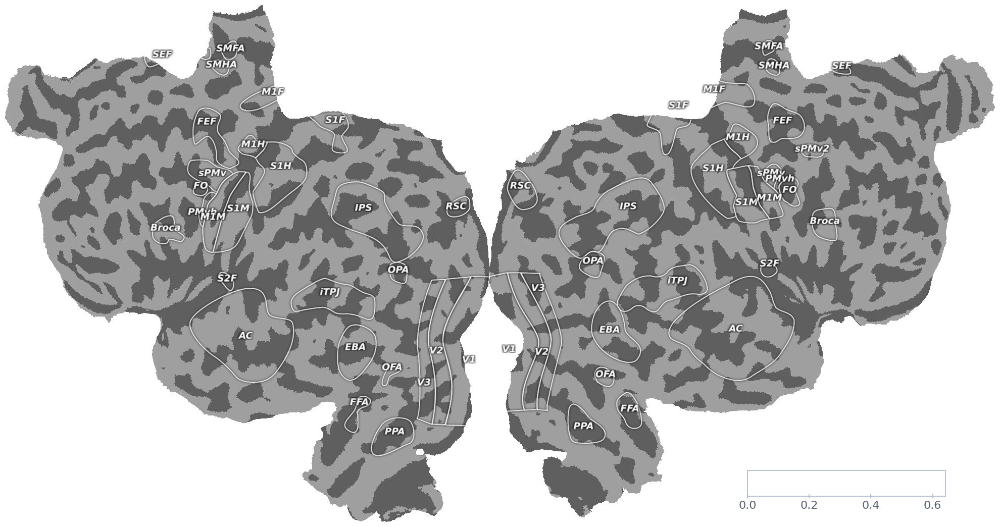

In [7]:
plot_flatmap_from_mapper(ev, mapper_path, with_curvature=True, vmin=0,
                         vmax=np.max(ev), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')
plt.show()

# Variance Partitioning

## Low Level Prediction

In [8]:
low_level_file = os.path.join(get_result_path(modality, subject), f"{low_level_feature}_scores.csv")

In [9]:
print(f"Loading {low_level_file}")
low_level_scores = pd.read_csv(low_level_file)
low_level_scores.describe()

Loading results/reading/subject05/letters_scores.csv


,correlation_score,r2_score,p_value
count,80249.000000,80615.000000,8.024900e+04
mean,0.054438,0.004787,3.681681e-01
std,0.083353,0.017372,3.121442e-01
min,-0.452959,-0.055946,1.865958e-30
25%,-0.001030,-0.000001,7.100334e-02
50%,0.047075,0.000095,3.041640e-01
75%,0.099792,0.003532,6.300758e-01
max,0.593072,0.342416,9.999893e-01


In [10]:
low_level_correlation = low_level_scores['correlation_score']
low_level_correlation = low_level_correlation.to_numpy()
low_level_correlation = np.nan_to_num(low_level_correlation)

# significant_voxels = [True if p_value < 0.05 else False for p_value in low_level_scores['p_value']]
# masked_correlation = np.full(low_level_correlation.shape, np.nan)
# # set values to nan, if not significant
# masked_correlation[significant_voxels] = low_level_correlation[significant_voxels]

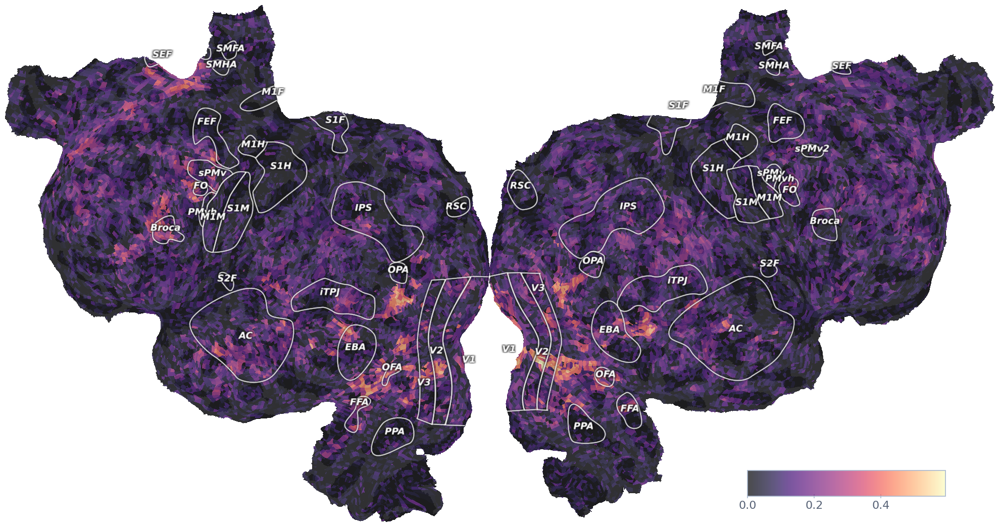

In [11]:
plot_flatmap_from_mapper(low_level_correlation, mapper_path, with_curvature=True, vmin=0,
                         vmax=np.max(low_level_correlation), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')
plt.show()

In [12]:
high_ev_voxels = [True if _ev > 0.1 else False for _ev in ev['# ev']]
masked_correlation = np.full(low_level_correlation.shape, np.nan)
# set values to nan, if not significant
masked_correlation[high_ev_voxels] = low_level_correlation[high_ev_voxels]

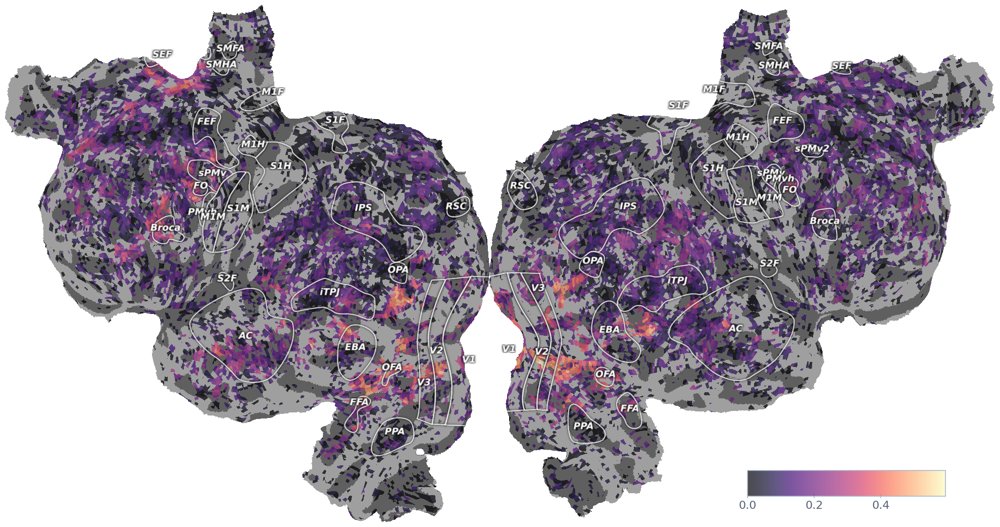

In [13]:
plot_flatmap_from_mapper(masked_correlation, mapper_path, with_curvature=True, vmin=0,
                         vmax=np.max(low_level_correlation), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')
plt.show()

## Semantic Prediction

In [14]:
semantic_file = os.path.join(get_result_path(modality, subject), f"english1000_scores.csv")

In [15]:
semantic_scores = pd.read_csv(semantic_file)
semantic_scores.describe()

,correlation_score,r2_score,p_value
count,80249.000000,8.061500e+04,8.024900e+04
mean,0.055075,7.041126e-03,3.717090e-01
std,0.097785,2.344282e-02,3.173558e-01
min,-0.352774,-9.834182e-02,6.432717e-27
25%,-0.010190,-6.212592e-04,6.243881e-02
50%,0.040068,1.192093e-07,3.142446e-01
75%,0.100786,5.806029e-03,6.427629e-01
max,0.562390,3.041438e-01,9.999955e-01


In [16]:
semantic_correlation = semantic_scores['correlation_score']
semantic_correlation = semantic_correlation.to_numpy()
semantic_correlation = np.nan_to_num(semantic_correlation)
vmax = semantic_correlation.max()
print(vmax)

significant_voxels = [True if p_value < 0.05 else False for p_value in semantic_scores['p_value']]
masked_correlation = np.full(semantic_correlation.shape, np.nan)
# set values to nan, if not significant
masked_correlation[significant_voxels] = semantic_correlation[significant_voxels]

0.5623895853190205


<Axes: >

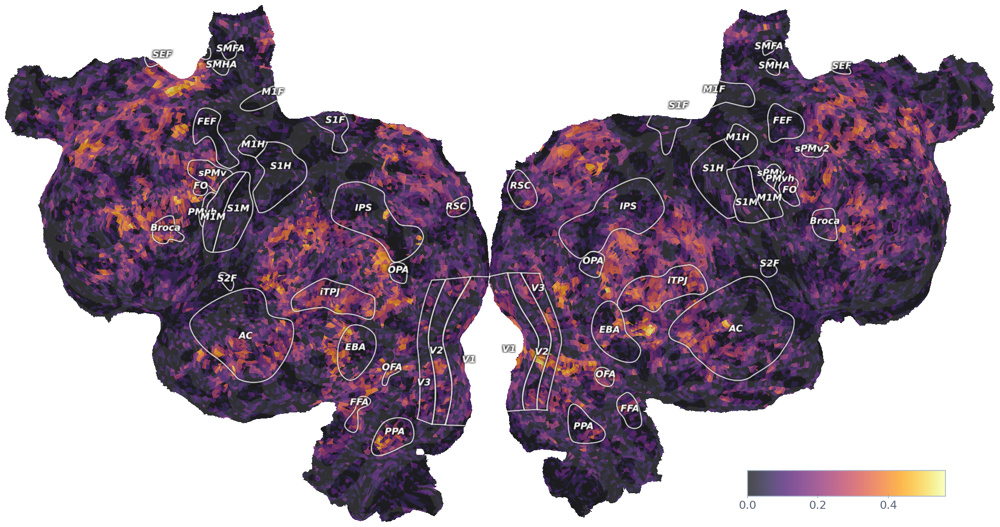

In [17]:
plot_flatmap_from_mapper(semantic_correlation, mapper_path, with_curvature=True, vmin=0,
                         vmax=vmax, colorbar_location=[0.75, 0.05, 0.2, 0.05])


## Joint Prediction

In [18]:
joint_file = os.path.join(get_result_path(modality, subject), f"joint_english1000_{low_level_feature}_scores.csv")

In [19]:
joint_scores = pd.read_csv(joint_file)
joint_scores.describe()

,correlation_score,r2_score,p_value
count,80249.000000,8.061500e+04,8.024900e+04
mean,0.056548,7.521363e-03,3.697373e-01
std,0.099363,2.494288e-02,3.177814e-01
min,-0.360373,-9.468675e-02,1.354776e-25
25%,-0.009777,-8.055568e-04,5.895929e-02
50%,0.040711,1.192093e-07,3.110936e-01
75%,0.102292,6.040037e-03,6.408462e-01
max,0.550033,2.991879e-01,9.999916e-01


In [20]:
joint_correlation = joint_scores['correlation_score']
joint_correlation = joint_correlation.to_numpy()
joint_correlation = np.nan_to_num(joint_correlation)

significant_voxels = [True if p_value < 0.05 else False for p_value in joint_scores['p_value']]
masked_correlation = np.full(joint_correlation.shape, np.nan)
# set values to nan, if not significant
masked_correlation[significant_voxels] = joint_correlation[significant_voxels]

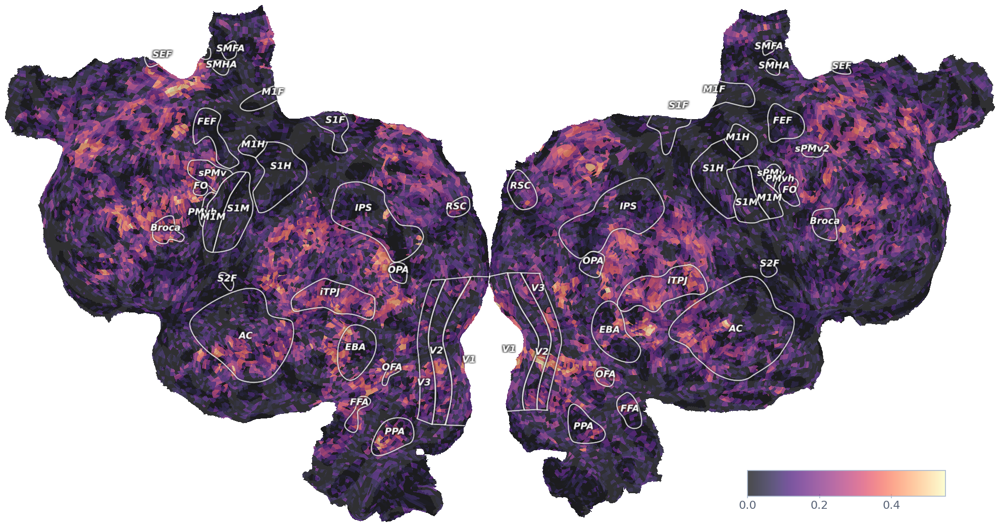

In [21]:
plot_flatmap_from_mapper(joint_correlation, mapper_path, vmin=0,
                         vmax=np.max(joint_correlation), colorbar_location=[0.75, 0.05, 0.2, 0.05], cmap='magma')

plt.show()

In [22]:
vp_path = os.path.join(get_result_path(modality, subject), f"vp_english1000_{low_level_feature}_scores.csv")

In [23]:
vp_scores = pd.read_csv(vp_path)
vp_scores.describe()

,semantic\letters,joint\letters
count,80615.000000,80615.000000
mean,0.043477,0.043477
std,0.069138,0.069138
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,0.066169,0.066169
max,0.535579,0.535579


In [24]:
vp_correlation = vp_scores[f'semantic\\{low_level_feature}']
vp_correlation = np.array(vp_correlation)
# vp_correlation = semantic_minus_low_level

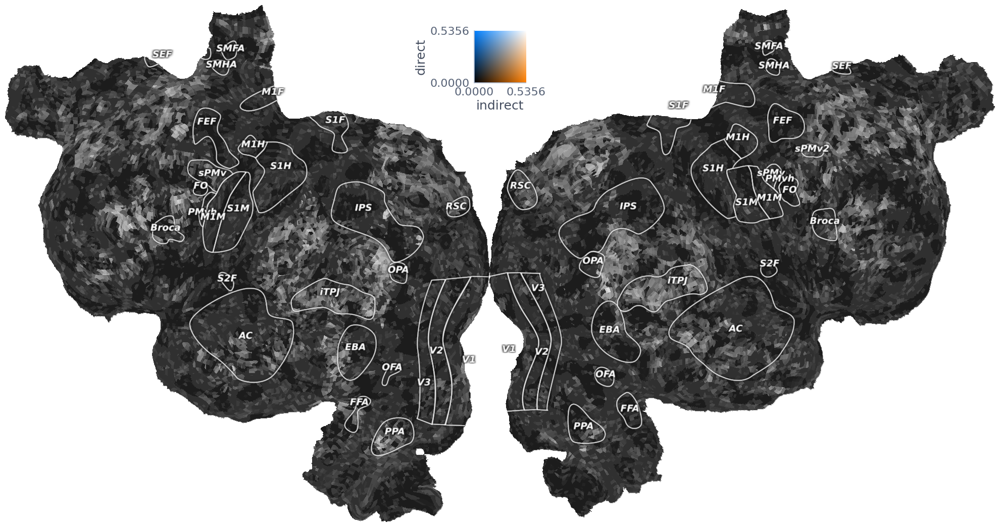

In [25]:
indirect = vp_scores[f'semantic\\{low_level_feature}']
direct = vp_scores[f'joint\\{low_level_feature}']
vmax = max(indirect.max(), direct.max())

plot_2d_flatmap_from_mapper(indirect, direct, mapper_path, vmin=0, vmin2=0, vmax=vmax, vmax2=vmax, label_1="indirect", label_2='direct')
plt.show()

# Residual Method

In [26]:
cross_path = os.path.join(get_result_path(modality, subject), f"cross_{low_level_feature}_english1000_scores.csv")

In [27]:
r2_scores = pd.read_csv(cross_path)

<Axes: ylabel='Count'>

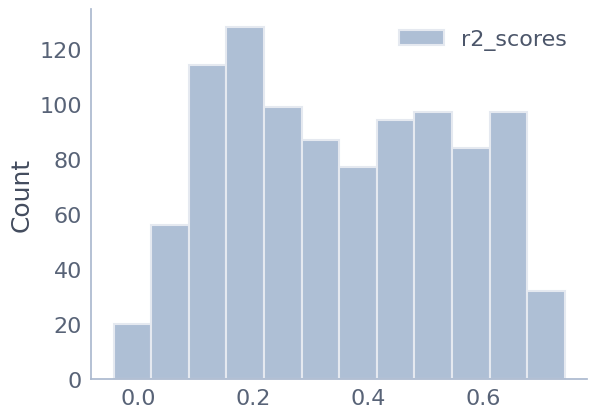

In [28]:
sns.histplot(r2_scores)

## Create Residuals

In [29]:
residual_file = os.path.join(get_result_path(modality, subject), f"residual_{low_level_feature}_english1000_scores.csv")

In [30]:
residual_scores = pd.read_csv(residual_file)
residual_scores.describe()

,Unnamed: 0,correlation_score,r2_score,p_value
count,80615.000000,80249.000000,80615.000000,8.024900e+04
mean,40307.000000,0.029141,0.002825,4.195107e-01
std,23271.690312,0.088343,0.016609,3.130445e-01
min,0.000000,-0.271929,-0.091472,6.288619e-27
25%,20153.500000,-0.029195,-0.000927,1.239222e-01
50%,40307.000000,0.017154,0.000000,3.934433e-01
75%,60460.500000,0.070684,0.001351,6.908001e-01
max,80614.000000,0.562480,0.279731,9.999889e-01


In [31]:
residual_correlation = residual_scores['correlation_score']
residual_correlation = residual_correlation.to_numpy()
residual_correlation = np.nan_to_num(residual_correlation)

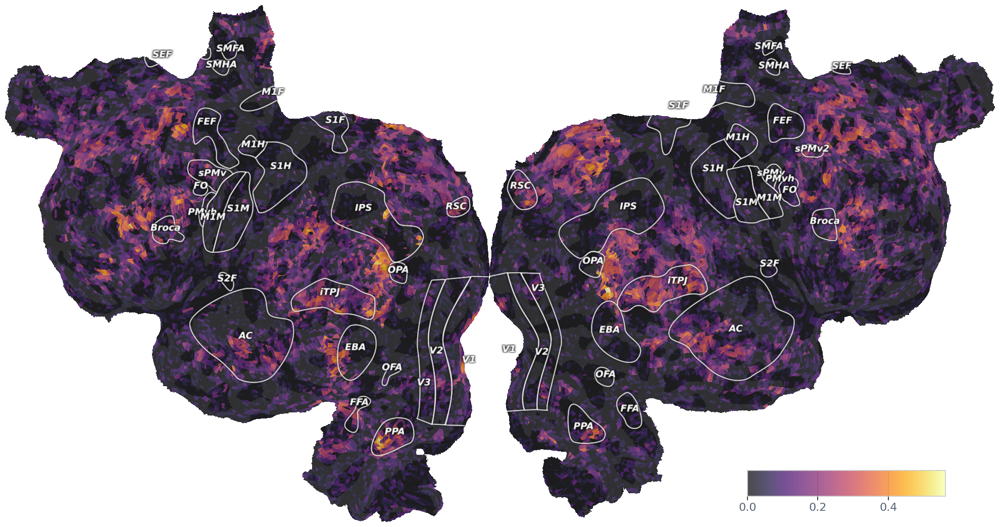

In [32]:
plot_flatmap_from_mapper(residual_correlation, mapper_path, vmin=0,
                         vmax=np.max(residual_correlation),
                         colorbar_location=[0.75, 0.05, 0.2, 0.05])

plt.show()

<Axes: >

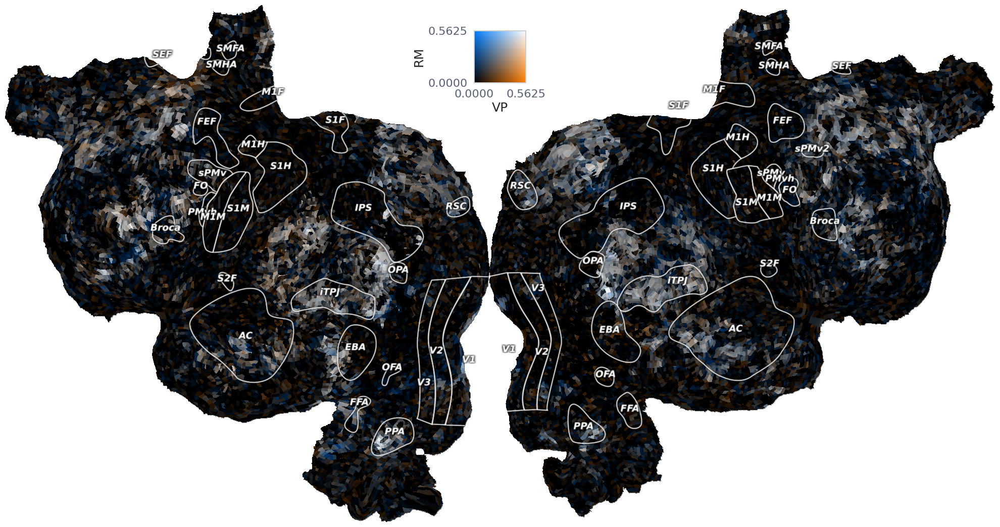

In [33]:
vmin = 0
vmax = max(vp_correlation.max(), residual_correlation.max())
plot_2d_flatmap_from_mapper(vp_correlation, residual_correlation, mapper_path, vmin=vmin, vmax=vmax, vmin2=vmin,
                            vmax2=vmax, alpha=1, label_1='VP', label_2="RM")

# Plot visual cortex side by side

/tmp/ipykernel_3691/1414988282.py:30: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


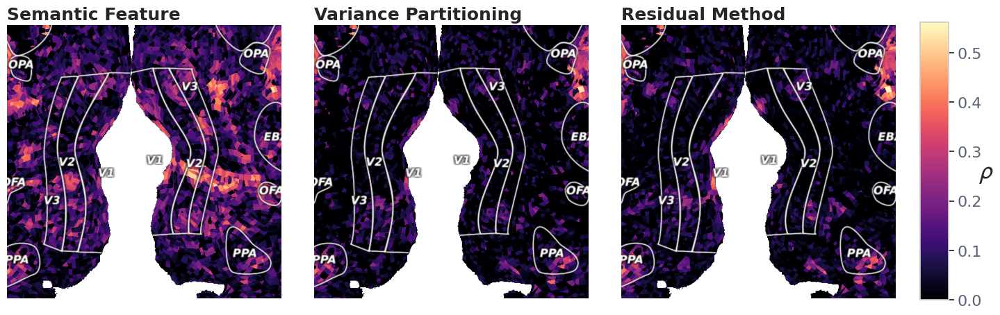

In [34]:
viewport_size = 450
fig, axs = plt.subplots(1, 3, figsize=(viewport_size / 100 * 3, viewport_size / 100))

vmax = max(semantic_correlation.max(), residual_correlation.max(), vp_correlation.max())

cmap = 'magma'
alpha = 1
width = flatmap_mask.shape[0]
height = flatmap_mask.shape[1]
vcenter = 2 * height / 3
hcenter = width / 2

for i, (corr, name) in enumerate(zip([semantic_correlation, vp_correlation, residual_correlation],
                                     ["Semantic Feature", "Variance Partitioning", "Residual Method"])):
    ax = axs[i]
    ax.axis('off')
    ax.set_xlim([hcenter - viewport_size / 2, hcenter + viewport_size / 2])
    ax.set_ylim([vcenter + viewport_size / 2, vcenter - viewport_size / 2])
    ax.set_title(name)
    plot_flatmap_from_mapper(corr, mapper_path, ax=ax, vmin=0, vmax=vmax, with_colorbar=False, cmap=cmap, alpha=alpha)

cbar_ax = fig.add_axes((1, 0.05, .03, 0.89))
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='magma'), cax=cbar_ax, orientation='vertical')
# cbar.ax.set_title(r"$\rho$", fontsize=26)
cbar.set_label(r"$\rho$", fontsize=26,
               rotation='horizontal')

plt.tight_layout()
plt.show()

# Plot auditory cortex side-by-side

/tmp/ipykernel_3691/2768811120.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


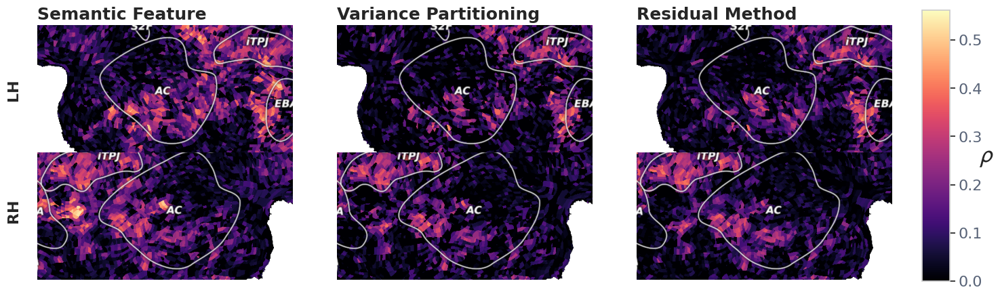

In [35]:
viewport_size = 450
fig, axs = plt.subplots(2, 3, figsize=(viewport_size / 100 * 3, viewport_size / 100))

vmax = max(semantic_correlation.max(), residual_correlation.max(), vp_correlation.max())

cmap = 'magma'
alpha = 1

width = flatmap_mask.shape[0]
height = flatmap_mask.shape[1]
vcenter = 2 * height / 3
hcenter = width / 2

left_ac = hcenter - 500
right_ac = hcenter + 450
vac = 650

for row, ac in enumerate([left_ac, right_ac]):
    for col, (corr, name) in enumerate(zip([semantic_correlation, vp_correlation, residual_correlation],
                                           ["Semantic Feature", "Variance Partitioning", "Residual Method"])):
        ax = axs[row, col]

        ax.axis('off')
        ax.set_xlim([ac - viewport_size / 2, ac + viewport_size / 2])
        ax.set_ylim([vac + viewport_size / 4, vac - viewport_size / 4])

        if row == 0:
            ax.set_title(name)

        plot_flatmap_from_mapper(corr, mapper_path, ax=ax, vmin=0, vmax=vmax, with_colorbar=False, cmap=cmap,
                                 alpha=alpha)

fig.text(0, .65, "LH", rotation=90, horizontalalignment='left', weight='bold')
fig.text(0, .25, "RH", rotation=90, horizontalalignment='left', weight='bold')

cbar_ax = fig.add_axes((1, 0.05, .03, 0.89))
norm = mpl.colors.Normalize(vmin=0, vmax=vmax)

cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='magma'), cax=cbar_ax, orientation='vertical')
cbar.set_label(r"$\rho$", fontsize=26, rotation='horizontal', loc='center')

plt.tight_layout()
plt.subplots_adjust(hspace=0)
plt.show()

# Scatterplot of visual cortex

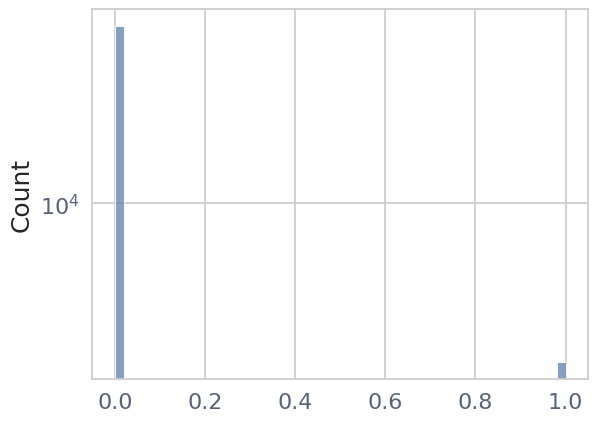

In [61]:
mapper = load_hdf5_array(mapper_path)
v1_mask = mapper['roi_mask_V1']
v2_mask = mapper['roi_mask_V2']
v3_mask = mapper['roi_mask_V3']
all_masks = v1_mask + v2_mask + v3_mask
# set all values > 0 to 1
all_masks[all_masks > 0] = 1
all_masks = all_masks.astype(bool)

sns.histplot(all_masks, kde=False, bins=50)
plt.yscale('log')

<Axes: >

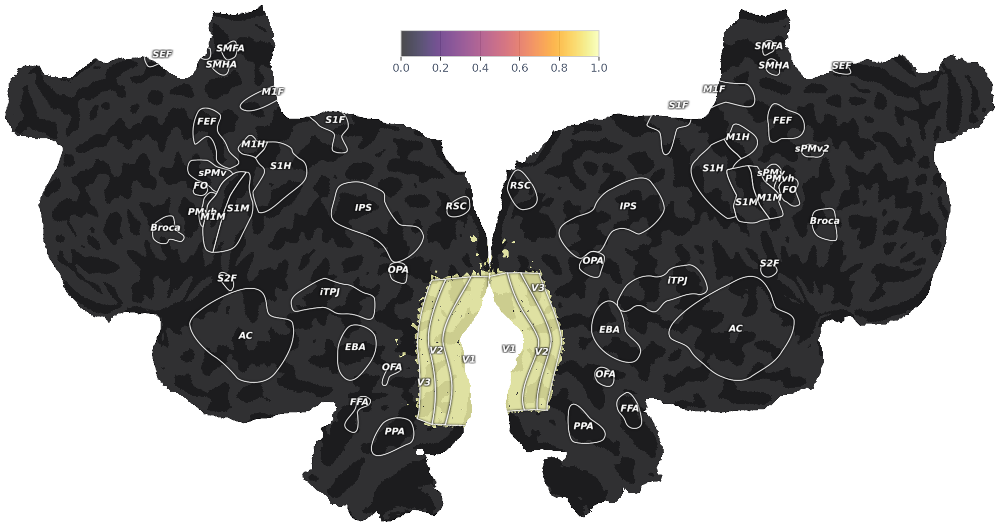

In [62]:
plot_flatmap_from_mapper(all_masks, mapper_path, vmin=0, vmax=all_masks.max())

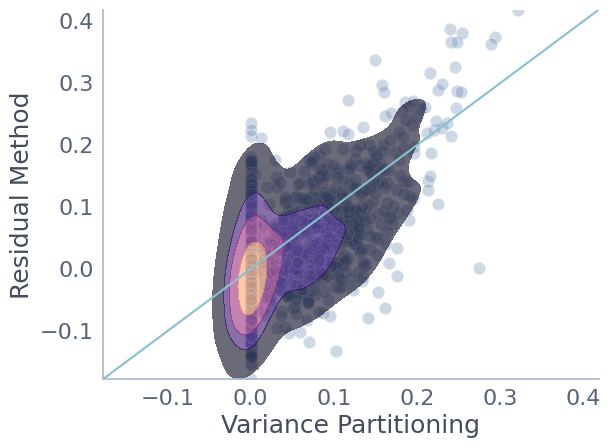

In [104]:
visual_vp = vp_correlation[all_masks]
visual_rm = residual_correlation[all_masks]
visual_data = pd.DataFrame()
visual_data["Variance Partitioning"] = visual_vp
visual_data["Residual Method"] = visual_rm
sns.scatterplot(x=visual_vp, y = visual_rm, alpha=0.3)
sns.kdeplot(x=visual_vp, y = visual_rm, levels=5, fill=True, alpha=0.6, cmap='magma')

plt.xlabel("Variance Partitioning")
plt.ylabel("Residual Method")

# sns.histplot(visual_data, x="Variance Partitioning", y="Residual Method", kde=True, cmap=cmap)
max_lims = max(visual_rm.max(), visual_vp.max())
min_lims = min(visual_rm.min(), visual_vp.min())
plt.xlim([min_lims, max_lims])
plt.ylim([min_lims, max_lims])
plt.plot([min_lims, max_lims], [min_lims, max_lims], color='C1')